In [2]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
import random
from plotly import tools
import plotly_express as px
from plotly.offline import init_notebook_mode,iplot,plot
import plotly.graph_objs as go

In [3]:
df_goods = pd.read_csv("data.csv")
df_goods

,InvoiceNo,StockCode,Description,Quantity,InvoiceDate,UnitPrice,CustomerID,Country
0,536365,85123A,WHITE HANGING HEART T-LIGHT HOLDER,6,12/1/2010 8:26,2.55,17850.0,United Kingdom
1,536365,71053,WHITE METAL LANTERN,6,12/1/2010 8:26,3.39,17850.0,United Kingdom
2,536365,84406B,CREAM CUPID HEARTS COAT HANGER,8,12/1/2010 8:26,2.75,17850.0,United Kingdom
3,536365,84029G,KNITTED UNION FLAG HOT WATER BOTTLE,6,12/1/2010 8:26,3.39,17850.0,United Kingdom
4,536365,84029E,RED WOOLLY HOTTIE WHITE HEART.,6,12/1/2010 8:26,3.39,17850.0,United Kingdom
...,...,...,...,...,...,...,...,...
541904,581587,22613,PACK OF 20 SPACEBOY NAPKINS,12,12/9/2011 12:50,0.85,12680.0,France
541905,581587,22899,CHILDREN'S APRON DOLLY GIRL,6,12/9/2011 12:50,2.10,12680.0,France
541906,581587,23254,CHILDRENS CUTLERY DOLLY GIRL,4,12/9/2011 12:50,4.15,12680.0,France
541907,581587,23255,CHILDRENS CUTLERY CIRCUS PARADE,4,12/9/2011 12:50,4.15,12680.0,France


In [4]:
df_goods.describe()

,Quantity,UnitPrice,CustomerID
count,541909.000000,541909.000000,406829.000000
mean,9.552250,4.611114,15287.690570
std,218.081158,96.759853,1713.600303
min,-80995.000000,-11062.060000,12346.000000
25%,1.000000,1.250000,13953.000000
50%,3.000000,2.080000,15152.000000
75%,10.000000,4.130000,16791.000000
max,80995.000000,38970.000000,18287.000000


In [5]:
df_goods.isnull().sum()

InvoiceNo           0
StockCode           0
Description      1454
Quantity            0
InvoiceDate         0
UnitPrice           0
CustomerID     135080
Country             0
dtype: int64

In [12]:
df_goods = df_goods.dropna()
df_goods.isnull().sum()

InvoiceNo      0
StockCode      0
Description    0
Quantity       0
InvoiceDate    0
UnitPrice      0
CustomerID     0
Country        0
dtype: int64

In [8]:
df_goods["InvoiceNo"].nunique()

22190

In [10]:
df_cancelled = df_goods[df_goods["InvoiceNo"].str.startswith("C")]
df_cancelled

,InvoiceNo,StockCode,Description,Quantity,InvoiceDate,UnitPrice,CustomerID,Country
141,C536379,D,Discount,-1,12/1/2010 9:41,27.50,14527.0,United Kingdom
154,C536383,35004C,SET OF 3 COLOURED FLYING DUCKS,-1,12/1/2010 9:49,4.65,15311.0,United Kingdom
235,C536391,22556,PLASTERS IN TIN CIRCUS PARADE,-12,12/1/2010 10:24,1.65,17548.0,United Kingdom
236,C536391,21984,PACK OF 12 PINK PAISLEY TISSUES,-24,12/1/2010 10:24,0.29,17548.0,United Kingdom
237,C536391,21983,PACK OF 12 BLUE PAISLEY TISSUES,-24,12/1/2010 10:24,0.29,17548.0,United Kingdom
...,...,...,...,...,...,...,...,...
540449,C581490,23144,ZINC T-LIGHT HOLDER STARS SMALL,-11,12/9/2011 9:57,0.83,14397.0,United Kingdom
541541,C581499,M,Manual,-1,12/9/2011 10:28,224.69,15498.0,United Kingdom
541715,C581568,21258,VICTORIAN SEWING BOX LARGE,-5,12/9/2011 11:57,10.95,15311.0,United Kingdom
541716,C581569,84978,HANGING HEART JAR T-LIGHT HOLDER,-1,12/9/2011 11:58,1.25,17315.0,United Kingdom


In [13]:
df_cancelled.InvoiceNo.nunique()

3654

In [14]:
df_goods = df_goods[~df_goods["InvoiceNo"].str.startswith("C")]
df_goods

,InvoiceNo,StockCode,Description,Quantity,InvoiceDate,UnitPrice,CustomerID,Country
0,536365,85123A,WHITE HANGING HEART T-LIGHT HOLDER,6,12/1/2010 8:26,2.55,17850.0,United Kingdom
1,536365,71053,WHITE METAL LANTERN,6,12/1/2010 8:26,3.39,17850.0,United Kingdom
2,536365,84406B,CREAM CUPID HEARTS COAT HANGER,8,12/1/2010 8:26,2.75,17850.0,United Kingdom
3,536365,84029G,KNITTED UNION FLAG HOT WATER BOTTLE,6,12/1/2010 8:26,3.39,17850.0,United Kingdom
4,536365,84029E,RED WOOLLY HOTTIE WHITE HEART.,6,12/1/2010 8:26,3.39,17850.0,United Kingdom
...,...,...,...,...,...,...,...,...
541904,581587,22613,PACK OF 20 SPACEBOY NAPKINS,12,12/9/2011 12:50,0.85,12680.0,France
541905,581587,22899,CHILDREN'S APRON DOLLY GIRL,6,12/9/2011 12:50,2.10,12680.0,France
541906,581587,23254,CHILDRENS CUTLERY DOLLY GIRL,4,12/9/2011 12:50,4.15,12680.0,France
541907,581587,23255,CHILDRENS CUTLERY CIRCUS PARADE,4,12/9/2011 12:50,4.15,12680.0,France


In [15]:
df_goods.describe()

,Quantity,UnitPrice,CustomerID
count,397924.000000,397924.000000,397924.000000
mean,13.021823,3.116174,15294.315171
std,180.420210,22.096788,1713.169877
min,1.000000,0.000000,12346.000000
25%,2.000000,1.250000,13969.000000
50%,6.000000,1.950000,15159.000000
75%,12.000000,3.750000,16795.000000
max,80995.000000,8142.750000,18287.000000


In [16]:
fig = px.histogram(df_goods.Quantity)
fig.show()

In [17]:
fig1 = px.histogram(df_goods.UnitPrice)
fig1.show()

In [18]:
df_goods = df_goods[df_goods.UnitPrice<5]
df_goods = df_goods[df_goods.Quantity<25]
df_goods

,InvoiceNo,StockCode,Description,Quantity,InvoiceDate,UnitPrice,CustomerID,Country
0,536365,85123A,WHITE HANGING HEART T-LIGHT HOLDER,6,12/1/2010 8:26,2.55,17850.0,United Kingdom
1,536365,71053,WHITE METAL LANTERN,6,12/1/2010 8:26,3.39,17850.0,United Kingdom
2,536365,84406B,CREAM CUPID HEARTS COAT HANGER,8,12/1/2010 8:26,2.75,17850.0,United Kingdom
3,536365,84029G,KNITTED UNION FLAG HOT WATER BOTTLE,6,12/1/2010 8:26,3.39,17850.0,United Kingdom
4,536365,84029E,RED WOOLLY HOTTIE WHITE HEART.,6,12/1/2010 8:26,3.39,17850.0,United Kingdom
...,...,...,...,...,...,...,...,...
541904,581587,22613,PACK OF 20 SPACEBOY NAPKINS,12,12/9/2011 12:50,0.85,12680.0,France
541905,581587,22899,CHILDREN'S APRON DOLLY GIRL,6,12/9/2011 12:50,2.10,12680.0,France
541906,581587,23254,CHILDRENS CUTLERY DOLLY GIRL,4,12/9/2011 12:50,4.15,12680.0,France
541907,581587,23255,CHILDRENS CUTLERY CIRCUS PARADE,4,12/9/2011 12:50,4.15,12680.0,France


In [19]:
df_goods.Description.value_counts().head()

WHITE HANGING HEART T-LIGHT HOLDER    1669
JUMBO BAG RED RETROSPOT               1328
PARTY BUNTING                         1274
LUNCH BAG RED RETROSPOT               1206
ASSORTED COLOUR BIRD ORNAMENT         1157
Name: Description, dtype: int64

D:\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning:

Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



<AxesSubplot:>

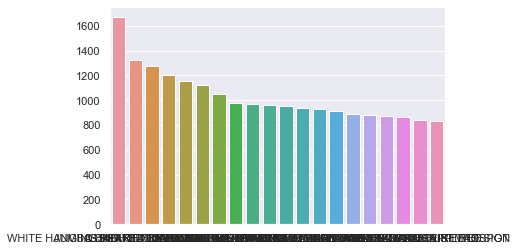

In [21]:
buying_count = df_goods.Description.value_counts()[:20]
sns.set()
sns.barplot(buying_count.index,buying_count.values)

D:\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning:

Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



(array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16,
        17, 18, 19]),
 [Text(0, 0, 'WHITE HANGING HEART T-LIGHT HOLDER'),
  Text(1, 0, 'JUMBO BAG RED RETROSPOT'),
  Text(2, 0, 'PARTY BUNTING'),
  Text(3, 0, 'LUNCH BAG RED RETROSPOT'),
  Text(4, 0, 'ASSORTED COLOUR BIRD ORNAMENT'),
  Text(5, 0, 'SET OF 3 CAKE TINS PANTRY DESIGN '),
  Text(6, 0, 'LUNCH BAG  BLACK SKULL.'),
  Text(7, 0, 'SPOTTY BUNTING'),
  Text(8, 0, 'LUNCH BAG SPACEBOY DESIGN '),
  Text(9, 0, 'PACK OF 72 RETROSPOT CAKE CASES'),
  Text(10, 0, 'REX CASH+CARRY JUMBO SHOPPER'),
  Text(11, 0, 'LUNCH BAG CARS BLUE'),
  Text(12, 0, 'NATURAL SLATE HEART CHALKBOARD '),
  Text(13, 0, 'LUNCH BAG PINK POLKADOT'),
  Text(14, 0, 'HEART OF WICKER SMALL'),
  Text(15, 0, 'LUNCH BAG SUKI DESIGN '),
  Text(16, 0, "PAPER CHAIN KIT 50'S CHRISTMAS "),
  Text(17, 0, 'ALARM CLOCK BAKELIKE RED '),
  Text(18, 0, 'BAKING SET 9 PIECE RETROSPOT '),
  Text(19, 0, 'LUNCH BAG APPLE DESIGN')])

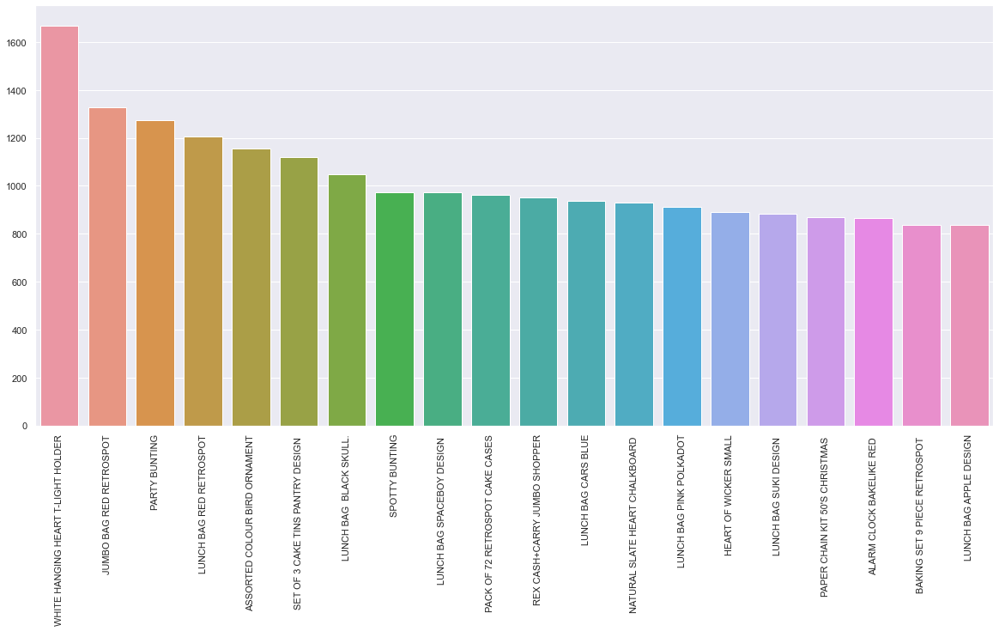

In [22]:
buying_count = df_goods.Description.value_counts()[:20]
sns.set()
plt.figure(figsize=(20,9))
sns.barplot(buying_count.index,buying_count.values)
plt.xticks(rotation=90)

In [23]:
df_customer_country_map = df_goods[['CustomerID','InvoiceNo','Country']].groupby(['CustomerID','InvoiceNo','Country']).count()
df_customer_country_map = df_customer_country_map.reset_index(drop=False)
df_customer_country_map

,CustomerID,InvoiceNo,Country
0,12347.0,537626,Iceland
1,12347.0,542237,Iceland
2,12347.0,549222,Iceland
3,12347.0,556201,Iceland
4,12347.0,562032,Iceland
...,...,...,...
16602,18283.0,579673,United Kingdom
16603,18283.0,580872,United Kingdom
16604,18287.0,554065,United Kingdom
16605,18287.0,570715,United Kingdom


In [24]:
contries= df_customer_country_map['Country'].value_counts()

In [25]:
data = dict(type='choropleth',
            locations=contries.index,
            locationmode='country names',z=contries,
            text=contries.index,colorbar={'title':'订单数'},
            colorscale=[[0,'rgb(255,255,255)'],[0.1,'rgb(0,255,255)'],[1,'rgb(255,0,255)']])
layout = dict(title='订单国家分布')
fig3 = go.Figure(data=[data],layout=layout)
iplot(fig3,validate=False)


In [26]:
df_customer_order_count = df_customer_country_map.groupby("CustomerID").count()
df_customer_order_count

,InvoiceNo,Country
CustomerID,,
12347.0,7,7
12348.0,3,3
12349.0,1,1
12350.0,1,1
12352.0,7,7
...,...,...
18280.0,1,1
18281.0,1,1
18282.0,2,2


D:\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning:

Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



([<matplotlib.axis.XTick at 0x1f44d659ca0>,
 [Text(0, 0, '12748.0'),
  Text(1, 0, '14911.0'),
  Text(2, 0, '17841.0'),
  Text(3, 0, '15311.0'),
  Text(4, 0, '14606.0'),
  Text(5, 0, '13089.0'),
  Text(6, 0, '12971.0'),
  Text(7, 0, '14527.0'),
  Text(8, 0, '13408.0'),
  Text(9, 0, '14646.0'),
  Text(10, 0, '15039.0'),
  Text(11, 0, '14298.0'),
  Text(12, 0, '17811.0'),
  Text(13, 0, '15189.0'),
  Text(14, 0, '12921.0'),
  Text(15, 0, '16422.0'),
  Text(16, 0, '13468.0'),
  Text(17, 0, '13767.0'),
  Text(18, 0, '14156.0'),
  Text(19, 0, '17315.0')])

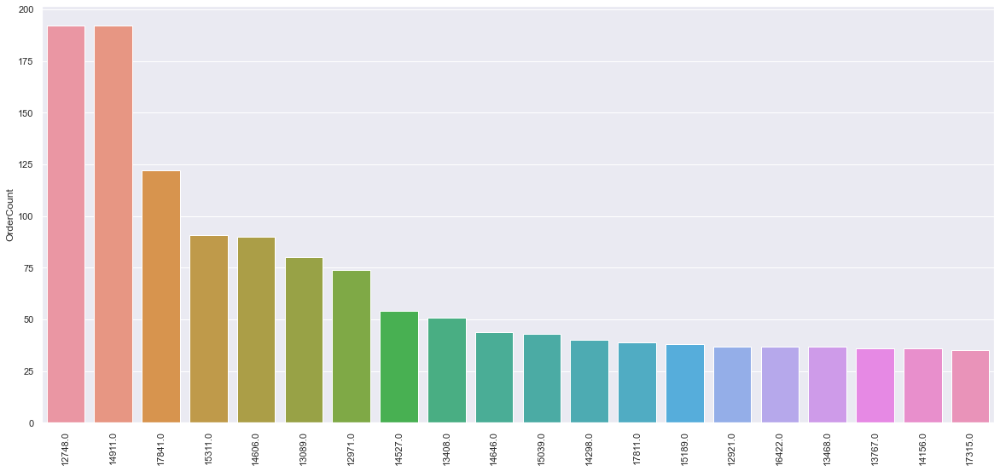

In [27]:
df_customer_order_count = df_customer_order_count.sort_values(by="InvoiceNo",ascending=False).head(20)
df_customer_order_count = df_customer_order_count.reset_index(drop=False)
df_customer_order_count = df_customer_order_count.rename(columns={"InvoiceNo":"OrderCount"})
fig = plt.figure(figsize=(20,9))
sns.barplot(df_customer_order_count.index,df_customer_order_count.OrderCount)
plt.xticks(df_customer_order_count.index,df_customer_order_count.CustomerID,rotation=90)

In [28]:
df_goods["TotalPrice"] = df_goods["UnitPrice"] * df_goods["Quantity"]
df_goods

,InvoiceNo,StockCode,Description,Quantity,InvoiceDate,UnitPrice,CustomerID,Country,TotalPrice
0,536365,85123A,WHITE HANGING HEART T-LIGHT HOLDER,6,12/1/2010 8:26,2.55,17850.0,United Kingdom,15.30
1,536365,71053,WHITE METAL LANTERN,6,12/1/2010 8:26,3.39,17850.0,United Kingdom,20.34
2,536365,84406B,CREAM CUPID HEARTS COAT HANGER,8,12/1/2010 8:26,2.75,17850.0,United Kingdom,22.00
3,536365,84029G,KNITTED UNION FLAG HOT WATER BOTTLE,6,12/1/2010 8:26,3.39,17850.0,United Kingdom,20.34
4,536365,84029E,RED WOOLLY HOTTIE WHITE HEART.,6,12/1/2010 8:26,3.39,17850.0,United Kingdom,20.34
...,...,...,...,...,...,...,...,...,...
541904,581587,22613,PACK OF 20 SPACEBOY NAPKINS,12,12/9/2011 12:50,0.85,12680.0,France,10.20
541905,581587,22899,CHILDREN'S APRON DOLLY GIRL,6,12/9/2011 12:50,2.10,12680.0,France,12.60
541906,581587,23254,CHILDRENS CUTLERY DOLLY GIRL,4,12/9/2011 12:50,4.15,12680.0,France,16.60
541907,581587,23255,CHILDRENS CUTLERY CIRCUS PARADE,4,12/9/2011 12:50,4.15,12680.0,France,16.60


In [29]:
df_goods.InvoiceDate = pd.to_datetime(df_goods.InvoiceDate)
df_goods = df_goods.set_index("InvoiceDate")
df_goods

,InvoiceNo,StockCode,Description,Quantity,UnitPrice,CustomerID,Country,TotalPrice
InvoiceDate,,,,,,,,
2010-12-01 08:26:00,536365,85123A,WHITE HANGING HEART T-LIGHT HOLDER,6,2.55,17850.0,United Kingdom,15.30
2010-12-01 08:26:00,536365,71053,WHITE METAL LANTERN,6,3.39,17850.0,United Kingdom,20.34
2010-12-01 08:26:00,536365,84406B,CREAM CUPID HEARTS COAT HANGER,8,2.75,17850.0,United Kingdom,22.00
2010-12-01 08:26:00,536365,84029G,KNITTED UNION FLAG HOT WATER BOTTLE,6,3.39,17850.0,United Kingdom,20.34
2010-12-01 08:26:00,536365,84029E,RED WOOLLY HOTTIE WHITE HEART.,6,3.39,17850.0,United Kingdom,20.34
...,...,...,...,...,...,...,...,...
2011-12-09 12:50:00,581587,22613,PACK OF 20 SPACEBOY NAPKINS,12,0.85,12680.0,France,10.20
2011-12-09 12:50:00,581587,22899,CHILDREN'S APRON DOLLY GIRL,6,2.10,12680.0,France,12.60
2011-12-09 12:50:00,581587,23254,CHILDRENS CUTLERY DOLLY GIRL,4,4.15,12680.0,France,16.60


In [30]:
df_cum = df_goods[["TotalPrice"]]
df_cum["date"] = df_cum.index.date
df_cum

<ipython-input-30-bb76b9a9518b>:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



,TotalPrice,date
InvoiceDate,,
2010-12-01 08:26:00,15.30,2010-12-01
2010-12-01 08:26:00,20.34,2010-12-01
2010-12-01 08:26:00,22.00,2010-12-01
2010-12-01 08:26:00,20.34,2010-12-01
2010-12-01 08:26:00,20.34,2010-12-01
...,...,...
2011-12-09 12:50:00,10.20,2011-12-09
2011-12-09 12:50:00,12.60,2011-12-09
2011-12-09 12:50:00,16.60,2011-12-09


<AxesSubplot:xlabel='date'>

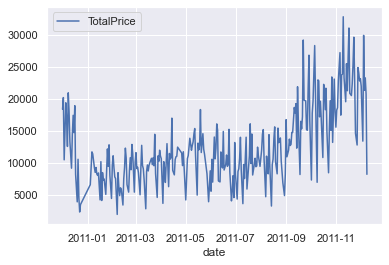

In [31]:
df_cum =df_cum.groupby("date").sum()
df_cum.plot()

使用 DataFrame 的 describe 做数据概览，数据概览报告的含义；

使用 isna().sum() 查看缺失值情况，并使用 dropna 删除缺失值；

使用字符串匹配的方法查找 DataFrame 中符合条件的记录；

使用 plotly 绘制可交互的图表来更高效的处理异常值；

使用 plt.xticks 的 rotation 参数来旋转 x 轴刻度，避免重叠；

使用 plotly 绘制世界频率地图。